# **LIBRARIES**

## *Install libraries*

In [1]:
!pip install pyspark geopandas folium mapclassify country_converter geolib branca altair

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 281.4 MB 50 kB/s 
     |████████████████████████████████| 1.1 MB 40.7 MB/s 
     |████████████████████████████████| 53 kB 2.2 MB/s 
     |████████████████████████████████| 199 kB 65.8 MB/s 
     |████████████████████████████████| 7.8 MB 54.5 MB/s 
     |████████████████████████████████| 16.6 MB 51 kB/s 
  Created wheel for pyspark: filename=pyspark-3.3.1-py2.py3-none-any.whl size=281845512 sha256=90ab89fdba6c40e69c934c702f7081064272fb38878c136f3da2610afd6603c5
  Stored in directory: /root/.cache/pip/wheels/43/dc/11/ec201cd671da62fa9c5cc77078235e40722170ceba231d7598
  Created wheel for country-converter: filename=country_converter-0.8.0-py3-none-any.whl size=55657 sha256=c869435cace27f9045f6a23eaed7ac320df71ba2d1262f23b649ef2e66160cae
  Stored in directory: /root/.cache/pip/wheels/c2/5a/f6/7187fa51e18f2ed105833a7f5c44a2475ace0c96e19118e608
Successful

## *Import libraries*

In [2]:
import os
import json
import zipfile
import time
import datetime
import warnings

from pyspark.sql import SparkSession
from pyspark.sql.functions import lit, when, mean, round, array_position, monotonically_increasing_id, regexp_replace, col, isnan, count
from pyspark.sql.types import StructType, StructField, LongType, StringType, ArrayType, IntegerType, FloatType
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.clustering import KMeans

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
from geopandas import GeoDataFrame

from shapely.geometry import Point

import folium
import mapclassify
import country_converter as coco
import geolib.geohash

import branca.colormap
from collections import defaultdict
import altair as alt

warnings.filterwarnings("ignore")

# **GENERAL FUNCTIONS**

In [3]:
# This function creates a cleaned and well structured spark dataframe from the url of a json file
# INPUT: json url
# OUTPUT: spark dataframe

def retrieve_p_values(url):

    # We use the spark.read.json method to create our spark dataframe from a json file
    df = spark.read.json(url)

    # We retrieve important values from dictionnaries and create columns from them
    df = df.withColumn("country", df.location.country).withColumn("latitude", df.location.latitude).withColumn("longitude", df.location.longitude).withColumn("sensor_id", df.sensor.id).withColumn("sensor_name", df.sensor.sensor_type['name'])
    
    # We retrieve P1 and P2 values where there are some, otherwise we add 'None' values
    df = df.withColumn("P1", when((array_position(df.sensordatavalues.value_type, "P1")!=0), df.sensordatavalues.value[array_position(df.sensordatavalues.value_type, "P1")-1]).otherwise(lit(None)))
    df = df.withColumn("P2", when((array_position(df.sensordatavalues.value_type, "P2")!=0), df.sensordatavalues.value[array_position(df.sensordatavalues.value_type, "P2")-1]).otherwise(lit(None)))
    
    # We drop useless columns
    df = df.drop("location","sampling_rate","sensor","sensordatavalues")
    
    # We drop rows where P1 and P2 are null
    df = df.na.drop(subset=["P1","P2"])
    
    # We just change the type of our columns in order to process them after
    df = df.withColumn("P1",df.P1.cast('float')).withColumn("P2",df.P2.cast('float')).withColumn("latitude",df.latitude.cast('float')).withColumn("longitude",df.longitude.cast('float'))
    
    return df

In [4]:
# This function calculates the AQI value after having grouped by a certain feature the original spark dataframe
# INPUT: spark dataframe, feature of this dataframe (either 'country'(for question 1) or 'cluster'(for question 2))
# OUPUT: spark dataframe

def calculate_aqi(df, feature):
    # First we select only the rows where P1 or P2 are positive
    # Then we group by the specific feature and calculate the average value of P1 and P2
    result = df.where((df.P1 >= 0) | (df.P2 >= 0)).groupBy(feature).agg(mean("P1"), mean("P2"))
    
    # We round up P1 and P2 values in order to calculate properly the AQI
    result = result.withColumn("avg(P1)", round(result["avg(P1)"], 0)).withColumn("avg(P2)", round(result["avg(P2)"], 0))
    
    # Now that we will attribute a AQI value for each P1 and P2 values according to the AQI index
    result = result.withColumn("AQI_P1", when((result['avg(P1)'] >= 0) & (result['avg(P1)'] <= 16), lit(1)).when((result['avg(P1)'] >= 17) & (result['avg(P1)'] <= 33), lit(2)).when((result['avg(P1)'] >= 34) & (result['avg(P1)'] <= 50), lit(3)).when((result['avg(P1)'] >= 51) & (result['avg(P1)'] <= 58), lit(4)).when((result['avg(P1)'] >= 59) & (result['avg(P1)'] <= 66), lit(5)).when((result['avg(P1)'] >= 67) & (result['avg(P1)'] <= 75), lit(6)).when((result['avg(P1)'] >= 76) & (result['avg(P1)'] <= 83), lit(7)).when((result['avg(P1)']>= 84) & (result['avg(P1)'] <= 91), lit(8)).when((result['avg(P1)'] >= 92) & (result['avg(P1)'] <= 100), lit(9)).otherwise(lit(10)))
    result = result.withColumn("AQI_P2", when((result['avg(P2)'] >= 0) & (result['avg(P2)'] <= 11), lit(1)).when((result['avg(P2)'] >= 12) & (result['avg(P2)'] <= 23), lit(2)).when((result['avg(P2)'] >= 24) & (result['avg(P2)'] <= 35), lit(3)).when((result['avg(P2)'] >= 36) & (result['avg(P2)'] <= 41), lit(4)).when((result['avg(P2)'] >= 42) & (result['avg(P2)'] <= 47), lit(5)).when((result['avg(P2)'] >= 48) & (result['avg(P2)'] <= 53), lit(6)).when((result['avg(P2)'] >= 54) & (result['avg(P2)'] <= 58), lit(7)).when((result['avg(P2)']>= 59) & (result['avg(P2)'] <= 64), lit(8)).when((result['avg(P2)'] >= 65) & (result['avg(P2)'] <= 70), lit(9)).otherwise(lit(10)))

    # Then we compare the AQI for P1 and the AQI for P2 and we select the maximum
    result = result.withColumn("AQI", when((result.AQI_P1 >= result.AQI_P2), result.AQI_P1).otherwise(result.AQI_P2))

    # We drop the AQI for P1 and for P2 that we calculate previously
    result = result.drop("AQI_P1","AQI_P2")
    
    return result    

In [5]:
# This function calculate the AQI improvement between the previous 24h AQI calculated and the current AQI for the same sensor
# For each element from the last 24h, we tag as 'previous' and for each current element, we tag as 'current'
# INPUT: previous spark dataframe, previous AQI column, previous P1 column, previous P2 column, current spark dataframe, current AQI column, current P1 column, current P2 column, feature of this dataframe (either 'country'(for question 1) or 'cluster'(for question 2)) 
# OUTPUT: spark dataframe

def diff_aqi(previous_result, previous_AQI, previous_P1, previous_P2, current_result, current_AQI, current_P1, current_P2, feature):
    
    # We first join the previous spark dataframe with the current spark dataframe on the feature that we specified
    results = previous_result.join(current_result,on=feature)
    
    # Then we calculate the AQI improvement by doing a subtraction
    results = results.withColumn("diff_AQI", results[previous_AQI] - results[current_AQI])
    
    # We drop useless columns
    results = results.drop(previous_AQI, previous_P1, previous_P2)
    
    # We rename columns
    results = results.withColumnRenamed(current_AQI, 'AQI')
    results = results.withColumnRenamed(current_P1, 'avg(P1)')
    results = results.withColumnRenamed(current_P2, 'avg(P2)')
    
    # We sort our dataframe by the AQI improvement, then by the current AQI value if there are ties and finally by the specified feature
    results = results.sort(results.diff_AQI.desc(), results.AQI.asc(), results[feature].asc())
    
    # Finally we create a 'ranking' column that shows the rank of the specified feature
    results = results.withColumn("ranking", monotonically_increasing_id()+1)

    return results  

# **FUNCTIONS FOR FIRST TASK**

In [6]:
# This function is actually a response to the first task: it uses all functions we described before
# This function returns a truncated spark dataframe with the AQI improvement of a specified feature
# INPUT: a specified feature, a top
# OUTPUT: final spark dataframe

def multiples_files_country_diff(feature, top):

    # We sorted by name our list of json files
    json_files = sorted([pos_json for pos_json in os.listdir() if pos_json.endswith('.json')])

    # We create a empty dictionnary    
    dico = {}

    # We take the two last json files
    for url in json_files[-2:]:

        # We apply our 'retrieve_p_values' function to obtain a cleaned and a well structured
        df = retrieve_p_values(url)

        # We calculate the AQI thanks to 'calculate_aqi' for this dataframe and the specified feature and we stock it into a dictionnary
        dico[url] = calculate_aqi(df, feature)

        # We just rename some columns
        dico[url] = dico[url].withColumnRenamed('avg(P1)', 'P1' + '_' + str(json_files.index(url)))
        dico[url] = dico[url].withColumnRenamed('avg(P2)', 'P2' + '_' + str(json_files.index(url)))
        dico[url] = dico[url].withColumnRenamed('AQI', 'AQI' + '_' + str(json_files.index(url)))

    # We calculate the AQI improvement using our 'diff_aqi' function and the spark dataframe we stocked into the dictionnary
    results = diff_aqi(list(dico.values())[0], list(dico.values())[0].columns[3], list(dico.values())[0].columns[1], list(dico.values())[0].columns[2], list(dico.values())[1], list(dico.values())[1].columns[3], list(dico.values())[1].columns[1], list(dico.values())[1].columns[2], feature)
    
    # At the end, we only select the top values that we want
    df_results = spark.createDataFrame(results.head(top))
    
    return df_results

In [7]:
# This function displays the result for the first task and it also plots an interactive map with countries colored by their rank
# INPUT: a specified feature, a top
# OUTPUT: an interactive folium map

def plot_countries(feature, top):
    # First, we retrieve the final data by using the 'multiples_files_country_diff' function 
    df_results = multiples_files_country_diff(feature, top)
    
    # We display it
    print('For the first task, we obtain this spark dataframe composed of the top ' + str(top) + ' ' + feature + 's:')
    df_results.show()
    
    # We just rename our column 'country' to 'iso_a2'
    df_results = df_results.withColumnRenamed('country', 'iso_a2')

    # We convert our spark dataframe to pandas dataframe
    pandas_df = df_results.toPandas()
    
    # We get a geopandas dataframe which is already implemented in the geopandas library
    # This dataframe contains for each contries : boundaries, continent, full name and ISO A3 code
    world_filepath = gpd.datasets.get_path('naturalearth_lowres')
    world = gpd.read_file(world_filepath)
    
    # With our new geodataframe, we convert ISO A3 code to ISO A2
    world['iso_a2'] = coco.convert(names=world.iso_a3, to='ISO2')

    # And we drop rows where the ISO A2 code was not found
    world.drop(world[world.iso_a2 == 'not found'].index, inplace=True)
    
    # We then merge this previous geodataframe with our original pandas dataframe
    world = world.merge(pandas_df, on='iso_a2')
    
    # We rename back our 'iso_a2' column to 'country'
    world.rename(columns={'iso_a2': 'country'}, inplace=True)
    
    # We create a folium map in order to have a map in the background
    m = folium.Map(location=[20, 10], tiles="cartodbpositron", zoom_start=3)
    
    ## We create a colormap using branca and by creating a gradient of color
    # First we define the number of steps
    steps=top+1
    # We create a list of index
    index=[i for i in range(1,top+1)]
    # We create our colormap going from yellow to red stesp by steps
    colormap = branca.colormap.LinearColormap(['yellow', 'red'],vmin=1, vmax=top).to_step(index=index)
    # We create a default dictionnary
    gradient_map=defaultdict(dict)
    # We create the gradient by using the 'rgb_hex_str' method
    for i in range(steps):
        gradient_map[i] = colormap.rgb_hex_str(i)
    # We add a title to our color bar
    colormap.caption = 'Ranking of the country'
    # We add it to our interactive map
    colormap.add_to(m)

    return world.explore(column='ranking', cmap=colormap, color=gradient_map, m=m, legend=False, tooltip=['country','ranking','diff_AQI','AQI'])

# **FUNCTIONS FOR SECOND TASK**

In [8]:
# This function selects specified json files and union them after having cleaned and well structured with the 'retrieve_p_values' function
# INPUT: index (either -2 for the last two json files or 0 for all the json files)
# OUTPUT: 1 spark dataframe with only latitude and longitude without duplicates from sensors, 1 spark dataframe of the all union

def multiples_files_df(index):
  
    # We sorted by name our list of json files
    json_files = sorted([pos_json for pos_json in os.listdir() if pos_json.endswith('.json')])
    
    # We create an empty spark dataframe with the schema of the spark dataframe that we obtain from 'retrieve_p_values' function
    final_data = spark.createDataFrame([], StructType([StructField('id', LongType(), True), StructField('timestamp', StringType(), True), StructField('country', StringType(), True), StructField('latitude', FloatType(), True), StructField('longitude', FloatType(), True), StructField('sensor_id', LongType(), True), StructField('sensor_name', StringType(), True), StructField('P1', FloatType(), True), StructField('P2', FloatType(), True)]))    
    
    # We are going through json files depending of the index
    for url in json_files[index:]:

        # We apply our 'retrieve_p_values' function to obtain a cleaned and a well structured
        df = retrieve_p_values(url)

        # We add spark dataframe one to the other into this empty spark dataframe
        final_data = final_data.union(df)
    
    # We select only the 'latitude and 'longitude' column
    final_lon_lat = final_data.select('latitude','longitude')

    # We drop duplicates
    final_lon_lat = final_lon_lat.dropDuplicates()
    
    return final_lon_lat, final_data

In [9]:
# This function creates a KMeans model from all single sensors
# INPUT: index (either -2 for the last two json files or 0 for all the json files), k_value (number of clusters)
# OUTPUT: 1 KMeans model

def multiples_files_model(index,k_value):
    
    # From the function 'multiples_files_df', we only keep the 'latitude and 'longitude' spark dataframe
    model_df,_ = multiples_files_df(index)
    
    # We use 'VectorAssembler' from pyspark that merges multiple columns into a vector column
    assemble=VectorAssembler(inputCols=['latitude','longitude'], outputCol='features')
    
    # We transform our spark dataframe to obtain this new column 'features'
    assembled=assemble.transform(model_df) 
    
    # We create our KMeans model with a number of clusters of k_value, based on the column 'features' and with a seed 123
    KMeans_algo=KMeans(k=k_value, featuresCol='features', seed=123)

    # We train our model on the transformed spark dataframe
    KMeans_fit=KMeans_algo.fit(assembled)
    
    return KMeans_fit

In [10]:
# This function defines cluster from a specified spark dataframe
# INPUT: 1 spark dataframe, 1 KMeans model
# OUTPUT: 1 spark dataframe with a new column 'cluster' where each sensors from the input spark dataframe are grouped

def define_clusters(df, model):
    
    # We use 'VectorAssembler' from pyspark that merges multiple columns into a vector column
    assemble=VectorAssembler(inputCols=['latitude','longitude'], outputCol='features')
    
    # We transform our spark dataframe to obtain this new column 'features'
    assembled=assemble.transform(df)
    
    # We transform our spark dataframe to obtain this new column 'cluster'
    output=model.transform(assembled)
    
    # We drop a column
    output = output.drop("features")
    
    # We create a new column 'cluster' where the first cluster is 1 and not 0
    output = output.withColumn('cluster', output.prediction+1)
    
    # We drop a column
    output = output.drop("prediction")
    
    return output

In [11]:
# This function combines the two functions above
# INPUT: 1 json url, 1 KMeans model, 1 feature
# OUTPUT: 1 spark dataframe with a new column 'cluster', 1 spark dataframe with the calculated AQI

def set_dataframe(url, model, feature):

    # We apply our 'retrieve_p_values' function to obtain a cleaned and a well structured
    df = retrieve_p_values(url)
    
    # We apply our 'define_clusters' function to obtain a spark dataframe with the 'cluster' column
    output = define_clusters(df, model)

    # We apply our 'calculate_aqi' function to obtain a spark dataframe with the 'cluster' and their corresponding AQI
    result = calculate_aqi(output, feature)

    return output, result

In [12]:
# This function is actually a response to the second task: it uses all functions we described before
# This function returns a truncated spark dataframe with the AQI improvement of a specified feature
# INPUT: a number of cluster, a specified feature, a top
# OUTPUT: final spark dataframe with data from the last 24h and from now, final spark dataframe from current sensors

def multiples_files_cluster_diff(k_value, feature, top):

    # We sorted by name our list of json files  
    json_files = sorted([pos_json for pos_json in os.listdir() if pos_json.endswith('.json')])
    
    # We apply the 'multiples_files_model' function to create our KMeans model
    model = multiples_files_model(-2,k_value)
    
    dico = {}

    # We go through the last two recent json files
    for url in json_files[-2:]:

        # We apply 'set_dataframe' function and we strore the spark dataframe with the 'cluster' and their corresponding AQI
        _, dico[url] = set_dataframe(url, model, feature)
        dico[url] = dico[url].withColumnRenamed('avg(P1)', 'P1' + '_' + str(json_files.index(url)))
        dico[url] = dico[url].withColumnRenamed('avg(P2)', 'P2' + '_' + str(json_files.index(url)))
        dico[url] = dico[url].withColumnRenamed('AQI', 'AQI' + '_' + str(json_files.index(url)))

    # We apply 'diff_aqi' function to obtain the AQI improvement
    results = diff_aqi(list(dico.values())[0], list(dico.values())[0].columns[3], list(dico.values())[0].columns[1], list(dico.values())[0].columns[2], list(dico.values())[1], list(dico.values())[1].columns[3], list(dico.values())[1].columns[1], list(dico.values())[1].columns[2], feature)
    
    # We only select the top values that we want
    df_results = spark.createDataFrame(results.head(top))
    
    # We retrieve the current json file and 'set_dataframe' is applied to it
    current_output,_ = set_dataframe(json_files[-1], model, feature)
    
    # We make a join on the specified feature between the current spark dataframe and our top values dataframe
    current_df = current_output.join(df_results, on=feature)
    
    # We drop some columns
    current_df = current_df.drop('id','timestamp','sensor_id','sensor_name','P1','P2')
    
    return df_results, current_df

In [13]:
# This function displays the result for the second task and it also plots an interactive map with clusters colored by their rank
# INPUT: a number of cluster, a specified feature, a top
# OUTPUT: an interactive folium map

def plot_polygons_cluster_2(k_value, feature, top):

    # First we apply the function that answers the second task
    df_results, current_df = multiples_files_cluster_diff(k_value, feature, top)

    # We display it
    print('For the second task, we obtain this spark dataframe composed of the top ' + str(top) + ' ' + feature + 's:')
    df_results.show()

    # We convert the current spark dataframe to a pandas
    pandas_df = current_df.toPandas()
    
    # We construct a geodataframe based on the longitude and latitude of our sensors
    gdf = gpd.GeoDataFrame(pandas_df, geometry=gpd.points_from_xy(pandas_df["longitude"], pandas_df["latitude"]), crs="epsg:4386")

    # We cluster points to polygons by using the 'convex_hull' method from geopandas
    gdf2 = gdf.dissolve(by="cluster")
    gdf2["geometry"] = gdf2["geometry"].convex_hull

    # We create a folium map
    m = folium.Map(location=[20, 10], tiles="cartodbpositron", zoom_start=3)

    # Like before, we create a colormap using branca and by creating a gradient of color
    # But this time we will also create CircleMarker for each sensors we have
    steps=top+1
    index=[i for i in range(1,top+1)]
    
    colormap = branca.colormap.LinearColormap(['purple','blue','green','yellow','orange','red'],vmin=0, vmax=top).to_step(index=index)
    gradient_map=defaultdict(dict)
    for i in range(1,steps):
      gradient_map[i] = colormap.rgb_hex_str(i)
      latitudes = list(pandas_df[pandas_df['ranking']==i].latitude)
      longitudes = list(pandas_df[pandas_df['ranking']==i].longitude)
      for j in range(len(latitudes)):
        folium.CircleMarker(location=[latitudes[j], longitudes[j]], radius=2, weight=5, color=gradient_map[i]).add_to(m)
    
    colormap.caption = 'Ranking of the cluster'
    colormap.add_to(m)
    
    return gdf2.explore(column = "ranking", m=m, cmap=colormap, color=gradient_map, legend=False, tooltip=["cluster",'ranking','diff_AQI','AQI'])

# **FUNCTIONS FOR THIRD TASK**

In [14]:
# This function is quite similar ot the 'calculate_aqi', indeed the only difference is that we also groupby the 'date' column
# INPUT: spark dataframe, feature of this dataframe 
# OUPUT: spark dataframe with a new AQI column

def calculate_aqi_hist(df, feature):
    
    # Here, we also group by 'date'
    result = df.where((df.P1 >= 0) | (df.P2 >= 0)).groupBy(feature, 'date').agg(mean("P1"), mean("P2"))
    
    result = result.withColumn("avg(P1)", round(result["avg(P1)"], 0)).withColumn("avg(P2)", round(result["avg(P2)"], 0))
    
    result = result.withColumn("AQI_P1", when((result['avg(P1)'] >= 0) & (result['avg(P1)'] <= 16), lit(1)).when((result['avg(P1)'] >= 17) & (result['avg(P1)'] <= 33), lit(2)).when((result['avg(P1)'] >= 34) & (result['avg(P1)'] <= 50), lit(3)).when((result['avg(P1)'] >= 51) & (result['avg(P1)'] <= 58), lit(4)).when((result['avg(P1)'] >= 59) & (result['avg(P1)'] <= 66), lit(5)).when((result['avg(P1)'] >= 67) & (result['avg(P1)'] <= 75), lit(6)).when((result['avg(P1)'] >= 76) & (result['avg(P1)'] <= 83), lit(7)).when((result['avg(P1)']>= 84) & (result['avg(P1)'] <= 91), lit(8)).when((result['avg(P1)'] >= 92) & (result['avg(P1)'] <= 100), lit(9)).otherwise(lit(10)))
    result = result.withColumn("AQI_P2", when((result['avg(P2)'] >= 0) & (result['avg(P2)'] <= 11), lit(1)).when((result['avg(P2)'] >= 12) & (result['avg(P2)'] <= 23), lit(2)).when((result['avg(P2)'] >= 24) & (result['avg(P2)'] <= 35), lit(3)).when((result['avg(P2)'] >= 36) & (result['avg(P2)'] <= 41), lit(4)).when((result['avg(P2)'] >= 42) & (result['avg(P2)'] <= 47), lit(5)).when((result['avg(P2)'] >= 48) & (result['avg(P2)'] <= 53), lit(6)).when((result['avg(P2)'] >= 54) & (result['avg(P2)'] <= 58), lit(7)).when((result['avg(P2)']>= 59) & (result['avg(P2)'] <= 64), lit(8)).when((result['avg(P2)'] >= 65) & (result['avg(P2)'] <= 70), lit(9)).otherwise(lit(10)))

    result = result.withColumn("AQI", when((result.AQI_P1 >= result.AQI_P2), result.AQI_P1).otherwise(result.AQI_P2))
    
    result = result.drop("AQI_P1","AQI_P2")
    
    return result  

In [15]:
# This function is actually a response to the third task: it uses all functions we described before
# This function is a mix between 'multiples_files_model' and 'define_clusters'
# Just here we will create a model based on all sensors we collected through time ('final_lon_lat' dataframe)
# And we will apply this KMeans model on all sensors to determine clusters through time
# Moreover, we keep the centroids of ou clusters
# INPUT: number of clusters we want
# OUTPUT: a spark dataframe with all sensors with their cluster and their centroids, a spark dataframe with currents sensors and their clusters

def multiples_files_model_and_cluster(k_value):
    
    # From the function 'multiples_files_df', we have a 'latitude' and 'longitude' spark dataframe and a spark dataframe with all the sensors
    final_lon_lat, final_data = multiples_files_df(0)

    # As before, we transform our 'latitude'/'longitude' spark dataframe with 'VectorAssembler'
    assemble=VectorAssembler(inputCols=['latitude','longitude'], outputCol='features')    
    assembled=assemble.transform(final_lon_lat) 
    
    # We create our KMeans model
    KMeans_algo=KMeans(k=k_value, featuresCol='features', seed=123)
    
    # We train our model
    KMeans_fit=KMeans_algo.fit(assembled)
    
    # Here we collect the centroids using the 'clusterCenters' method in a list
    center = []
    centers = KMeans_fit.clusterCenters()
    for i in range (len(centers)) :
        row = centers[i]
        # We add to the list the cluster number, the center latitude and the center longitude
        center.append([i,float(row[0]), float(row[1])])
        # center.append([i,float(np.round(float(row[0]),2)), float(np.round(float(row[1]),2))])
    
    # We create a spark dataframe based on that previous list
    cluster_centers = spark.createDataFrame(center, ['cluster', 'latitude_center', 'longitude_center'])
    
    # We transform our spark dataframe to obtain this new column 'cluster'
    output=KMeans_fit.transform(assembled)
    
    # We structured our spark dataframe
    output = output.drop("features").withColumnRenamed('prediction', 'cluster')
    
    # We do a join between the spark dataframe with results from the KMeans transformation and our original spark dataframe with all th sensors
    all_df = final_data.join(output, (final_data["latitude"] == output["latitude"]) & (final_data["longitude"] == output["longitude"]),"inner").select(final_data["*"],output["cluster"])
    
    # We do a final join between the last spark dataframe that we created and the cluster/centers spark dataframe
    all_df = all_df.join(cluster_centers, on='cluster')

    # We sorted by name our list of json files  
    json_files = sorted([pos_json for pos_json in os.listdir() if pos_json.endswith('.json')])

    # We apply our 'retrieve_p_values' function to obtain a cleaned and a well structured
    current_df = retrieve_p_values(json_files[-1])
    
    # We apply our 'define_clusters' function to obtain a spark dataframe with the 'cluster' column
    current_output = define_clusters(current_df, KMeans_fit)
    
    return all_df, current_output

In [16]:
# This function is similar to 'set_dataframe' function, because we make a summary of all functions in order to have a spark dataframe ready for the third task
# INPUT: a number of clusters, a specified feature
# OUPUT: a final spark dataframe

def multiples_files_cluster_hist(k_value, feature):
    
    # We apply 'multiples_files_model_and_cluster' to obtain a clusters/centers for each sensors spark dataframe
    all_df, current_df = multiples_files_model_and_cluster(k_value)
    
    # We use regex to create a new column 'date' essential for the third task
    all_df = all_df.withColumn('date', regexp_replace('timestamp', r'\s(.*)', ''))

    # We use the 'calculate_aqi_hist' function to calculate the AQI for each cluster for each day
    all_result = calculate_aqi_hist(all_df, feature)
    
    # We join the cluster/date spark dataframe  with the AQI/cluster/date spark dataframe 
    final_all_df = all_df.join(all_result, (all_df["cluster"] == all_result["cluster"]) & (all_df["date"] == all_result["date"]),"inner").select(all_df["*"],all_result["avg(P1)"], all_result["avg(P2)"], all_result["AQI"])
    
    # We drop some columns
    final_all_df = final_all_df.drop('id', 'timestamp', 'sensor_id', 'sensor_name', 'P1', 'P2')
    
    # We sort our spark dataframe by cluster and by date
    final_all_df = final_all_df.sort(final_all_df[feature].asc(), final_all_df['date'].asc())
    
    return final_all_df, current_df

In [17]:
# This function calculates the streak for a particular cluster
# INPUT: a spark dataframe, a specified feature, the number of the cluster
# OUTPUT: a spark dataframe with streak calculated, a list of the frequency for each streak

def plot_hist_by_cluster(pandas_df, feature, i):

    # First, we take only the sensors from the specified cluster
    df_cluster = pandas_df[pandas_df[feature]==i]

    # We select distinct values from our subset and we sort it by 'date'
    df_cluster_pandas = df_cluster.sort_values('date').drop_duplicates(subset=["date","cluster","latitude_center","longitude_center","AQI"])
    df_cluster_pandas.reset_index(drop=True, inplace=True)

    # We initialise the streak counter at 0
    streak=0
    # We create a list of streak counter and a list for the frequency of each streak
    streak_list = []
    frequency_streak = []

    # We retrieve the AQI values
    for aqi in df_cluster_pandas['AQI']:
        # If AQI is lower than 3, so it's a low index value
        if aqi <= 3:
            # We add 1 to our streak counter
            streak += 1
            # We strore it into our list
            streak_list.append(streak)
        # If AQI is upper than 3, so it's not a low index value
        else:
            # We store the last value of the streak
            frequency_streak.append(streak)
            # So we need to restart the streak counter
            streak=0
            # We strore it into our list
            streak_list.append(streak)

    if streak_list[-1] != 0:
      frequency_streak.append(streak_list[-1])
    
    # We create a new column into our initial pandas for the streak evolution  
    df_cluster_pandas['streak'] = streak_list
    
    return df_cluster_pandas, frequency_streak

In [18]:
# This function displays the result for the third task as popup in each cluster's marker and it also plots an interactive map with clusters and points for each sensors of the current date
# INPUT: a number of cluster, a specified feature
# OUTPUT: an interactive folium map

def plot_polygons_cluster_3(k_value, feature):

    # We use the 'multiples_files_cluster_hist' function
    results, current_df = multiples_files_cluster_hist(k_value, feature)
    
    # We display the results
    print('For the third task, we obtain this spark dataframe composed of all sensors through all the days we get:')
    results.show()

    # We duplicate our 'cluster' column
    results = results.withColumn('cluster_number', results.cluster)

    # We convert to pandas
    pandas_results = results.toPandas()
    pandas_current = current_df.toPandas()

    # We create our geodataframe
    gdf = gpd.GeoDataFrame(pandas_results, geometry=gpd.points_from_xy(pandas_results["longitude"], pandas_results["latitude"]), crs="epsg:4386")

    # We cluster points to polygons
    gdf2 = gdf.dissolve(by="cluster")
    gdf2["geometry"] = gdf2["geometry"].convex_hull

    # We create a folium map
    m = folium.Map(location=[20, 10], tiles="cartodbpositron", zoom_start=3)
    
    # Like before, we create a colormap and CircleMarker for each sensors of the current date
    steps=k_value
    index=[i for i in range(0,k_value)]
    colormap = branca.colormap.LinearColormap(['purple','blue','green','yellow','orange','red'],vmin=0, vmax=k_value).to_step(index=index)
    gradient_map=defaultdict(dict)
    for i in range(steps):
        gradient_map[i] = colormap.rgb_hex_str(i)
        latitudes = list(pandas_current[pandas_current['cluster']==i].latitude)
        longitudes = list(pandas_current[pandas_current['cluster']==i].longitude)
        for j in range(len(latitudes)):
          folium.CircleMarker(location=[latitudes[j], longitudes[j]], radius=2, weight=5, color=gradient_map[i]).add_to(m)
    
    colormap.caption = 'Number of the cluster'
    colormap.add_to(m)
    
    # We drop some columns of the spark dataframe of all sensors during all days
    pandas_results = pandas_results.drop(['latitude','longitude','avg(P1)', 'avg(P2)', 'cluster_number', 'geometry'], axis=1)
    
    # We go through our clusters
    for i in range(0,k_value):
        
        # We create a specific spark dataframe with streaks
        df_cluster_pandas, frequency_streak = plot_hist_by_cluster(pandas_results, feature, i)
        
        # We create a title
        title_date = alt.TitleParams('Streaks trough time', anchor='middle')
        title_hist = alt.TitleParams('The Frequency of streaks', anchor='middle')

        # We create a mark bar chart with altair

        # We keep only the last 10 days
        df_hist_pandas = df_cluster_pandas.iloc[-10:]
        df_hist_pandas.reset_index(drop=True, inplace=True)

        chart_date = alt.Chart(df_hist_pandas, title=title_date).mark_bar().encode(x=alt.X('date:T', axis=alt.Axis(format="%d/%m/%Y"), title='Dates on a 10 days window'), y=alt.Y('streak:Q', axis=alt.Axis(title='Length of streaks (in days)')))
        
        chart_hist = alt.Chart(pd.DataFrame({'streak': frequency_streak}), title=title_hist).mark_bar().encode(alt.X("streak:Q", axis=alt.Axis(values=[i for i in range(min(frequency_streak), max(frequency_streak)+1)], title='Length of streaks (in days)')), y=alt.Y('count()', axis=alt.Axis(title='Frequency')))

        chart = alt.hconcat(chart_date, chart_hist, spacing=50)
        
        # We convert this chart to json
        chart2 = json.loads(chart.to_json())

        # We create a popup
        popup = folium.Popup()

        # We add our json chart to our popup
        folium.features.VegaLite(chart2).add_to(popup)

        # We create a marker on the centroids location with the histogram into a popup
        folium.Marker(location=[df_cluster_pandas['latitude_center'][0],df_cluster_pandas['longitude_center'][0]], popup=popup).add_to(m)

    return gdf2.explore(column = 'cluster_number', m=m, cmap=colormap, color=gradient_map, legend=False, tooltip=[feature])

# **FUNCTION FOR ANALYSE LAST DAY DATA**

In [19]:
# This function analyses the last json file data by doing some displays and plots of our data
# INPUT: None
# OUTPUT: None

def last_day_analyse():
  # We sorted by name our list of json files
  json_files = sorted([pos_json for pos_json in os.listdir() if pos_json.endswith('.json')])

  # We take our last day of data
  last_day = json_files[-1]
  print('We will focus on this json file: ', last_day)
  print('\n')

  # We use the spark.read.json method to create our spark dataframe from a json file
  last_day_data = spark.read.json(last_day)
  print('It corresponds to this spark dataframe: ')
  last_day_data.show()
  print('\n')
  print('And it has this schema: ')
  last_day_data.printSchema()

  # We retrieve important values from dictionnaries and create columns from them
  last_day_data = last_day_data.withColumn("country", last_day_data.location.country).withColumn("latitude", last_day_data.location.latitude).withColumn("longitude", last_day_data.location.longitude).withColumn("sensor_id", last_day_data.sensor.id).withColumn("sensor_name", last_day_data.sensor.sensor_type['name'])
  
  # We retrieve P1 and P2 values where there are some, otherwise we add 'None' values
  last_day_data = last_day_data.withColumn("P1", when((array_position(last_day_data.sensordatavalues.value_type, "P1")!=0), last_day_data.sensordatavalues.value[array_position(last_day_data.sensordatavalues.value_type, "P1")-1]).otherwise(lit(None)))
  last_day_data = last_day_data.withColumn("P2", when((array_position(last_day_data.sensordatavalues.value_type, "P2")!=0), last_day_data.sensordatavalues.value[array_position(last_day_data.sensordatavalues.value_type, "P2")-1]).otherwise(lit(None)))

  # We drop useless columns
  last_day_data = last_day_data.drop("location","sampling_rate","sensor","sensordatavalues")

  print('After some cleaning and some extracting, we obtain this dataframe: ')
  last_day_data.show()
  print('\n')

  print('We count how many None values our dataframe contains for each columns: ')
  last_day_data.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in last_day_data.columns]).show()

  # We drop rows where P1 and P2 are null
  last_day_data = last_day_data.na.drop(subset=["P1","P2"])

  # We just change the type of our columns in order to process them after
  last_day_data = last_day_data.withColumn("P1",last_day_data.P1.cast('float')).withColumn("P2",last_day_data.P2.cast('float')).withColumn("latitude",last_day_data.latitude.cast('float')).withColumn("longitude",last_day_data.longitude.cast('float'))
  print('We will delete these values ! We now have our final dataframe: ')
  last_day_data.show()

  # We just rename our column 'country' to 'iso_a2'
  df_results = last_day_data.withColumnRenamed('country', 'iso_a2')

  # We convert our spark dataframe to pandas dataframe
  pandas_df = df_results.toPandas()
  
  # We get a geopandas dataframe which is already implemented in the geopandas library
  # This dataframe contains for each contries : boundaries, continent, full name and ISO A3 code
  world_filepath = gpd.datasets.get_path('naturalearth_lowres')
  original_world = gpd.read_file(world_filepath)

  # Some countries got the wrong ISO A3 code, so we just add the right ones manually
  original_world['iso_a3'][21] = 'NOR'
  original_world['iso_a3'][43] = 'FRA'
  original_world[original_world['name']=='Kosovo']['iso_a3'] = 'XKX'

  # We drop the other countries with a '-99' ISO A3 code
  original_world.drop(original_world[original_world.iso_a3 == '-99'].index, inplace=True)

  # We copy this geodataframe
  world = original_world.copy()
  
  # With our new geodataframe, we convert ISO A3 code to ISO A2
  world['iso_a2'] = coco.convert(names=world.iso_a3, to='ISO2')
  # And we drop rows where the ISO A2 code was not found
  world.drop(world[world.iso_a2 == 'not found'].index, inplace=True)
  
  # We then merge this previous geodataframe with our original pandas dataframe from the beginning
  world = world.merge(pandas_df, on='iso_a2')
  
  # We rename back our 'iso_a2' column to 'country'
  world.rename(columns={'iso_a2': 'country'}, inplace=True)
  print('\n')
  print('We have data from', len(world['continent'].unique()), 'different continents')
  print('We have sensors all over', len(world['name'].unique()), 'different countries')
  print('\n')

  # We then plot our sensors around the world

  ## We create our figure and axis
  fig, ax = plt.subplots(figsize=(24, 18))
  ## We plot the borders of all countries in black
  original_world.boundary.plot(ax=ax, alpha=0.4, color='black')
  ## We plot a world map
  original_world.plot(ax=ax, alpha=0.4, color="grey")
  ## We plot all the countries where there is sensors
  world.plot(column="continent", ax=ax, legend=True)
  ## We plot all the sensors around the world
  ax.scatter(x=world.longitude, y=world.latitude, color='red')
  plt.axis('off')
  plt.title('Distribution of sensors around the world', fontsize=20)
  plt.show()

  # We finally plot our sensors around the world with their ownership

  ## We create a new geodataframe based on our previous geodataframe 'world' but this time with sensors longitude and latitude
  geometry = [Point(xy) for xy in zip(world['longitude'], world['latitude'])]
  gdf = GeoDataFrame(world, geometry=geometry)   
  ## We create our figure and axis
  fig, ax = plt.subplots(figsize=(24, 18))
  ## We plot the borders of all countries in black
  original_world.boundary.plot(ax=ax, alpha=0.4, color='black')
  ## We plot a world map
  original_world.plot(ax=ax, alpha=0.4, color="grey")
  ## We plot all the sensors colored by the continent they belong to
  world.plot(column="continent", ax=ax, legend=True)
  plt.axis('off')
  plt.title('Distribution of sensors around the world with their ownership', fontsize=20)
  plt.show()

In [20]:
# We start a time here to see how much time it takes to run all our notebook
start = time.time()

# **SPARK**

## *Connect to our Spark Master*

In [21]:
# Here we create our spark session by assigning an app name, a master (here you have to change if you want to do it on local) and a memory
spark = SparkSession.\
        builder.\
        appName("pyspark-notebook").\
        master("local").\
        config("spark.executor.memory", "5g").\
        getOrCreate()

# **DATA**

## *Extract data from zip file*

In [22]:
# We are using ZipFile method to open and read all our files from the zip
# You have to specify the path where you located the zip file
with zipfile.ZipFile("data.zip","r") as zip_ref:
     zip_ref.extractall()

## *Analyse last day's data*

We will focus on this json file:  Data_sensor_30_11_2022.json


It corresponds to this spark dataframe: 
+-----------+--------------------+-------------+--------------------+--------------------+-------------------+
|         id|            location|sampling_rate|              sensor|    sensordatavalues|          timestamp|
+-----------+--------------------+-------------+--------------------+--------------------+-------------------+
|13165459369|{365.6, DE, 0, 16...|         null|{92, 1, {14, Nova...|[{29431393835, 34...|2022-11-30 15:24:48|
|13164918716|{373.1, DE, 0, 49...|         null|{107, 5, {1, Shin...|[{29430145346, 10...|2022-11-30 14:23:42|
|13164919354|{373.1, DE, 0, 49...|         null|{108, 7, {9, vari...|[{29430147156, 10...|2022-11-30 14:23:47|
|13165442600|{310.1, DE, 0, 45...|         null|{113, 11, {17, Bo...|[{29431355158, 10...|2022-11-30 15:23:16|
|13165452819|{282.5, DE, 0, 65...|         null|{140, 1, {14, Nov...|[{29431378674, 32...|2022-11-30 15:24:11|
|131654



We have data from 6 different continents
We have sensors all over 73 different countries




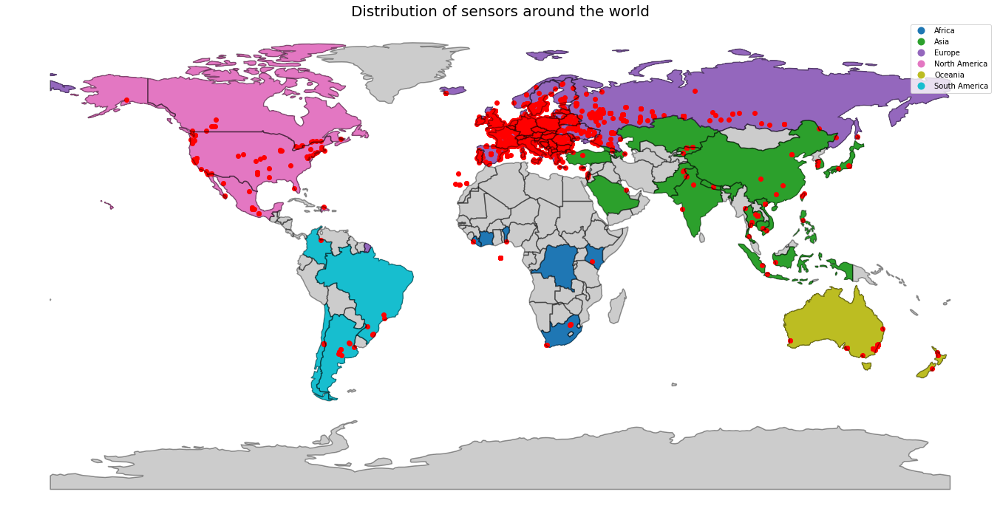

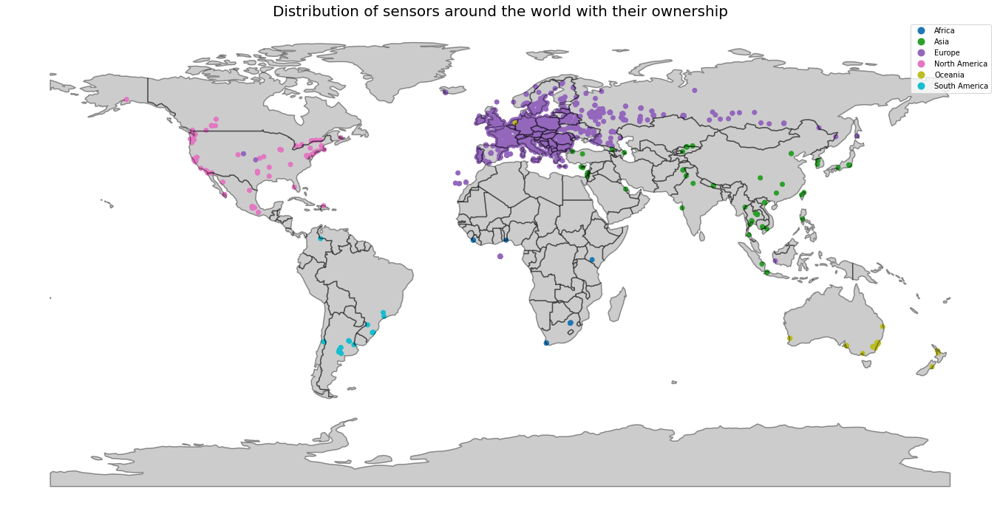

In [23]:
# Here, we analyse our last day data with the original table, the cleaned table, some plots
# Like that we can understand the processing that we did
last_day_analyse()

# **RESULTS**

## *FIRST TASK*

In [24]:
# We start a time here to see how much time it takes to run our first task
start_1 = time.time()

In [25]:
# Here we display the top 10 countries based on the AQI values from the current and the last day
# Moreover, we have an interactive map

plot_countries("country", 10)

For the first task, we obtain this spark dataframe composed of the top 10 countrys:
+-------+-------+-------+---+--------+-------+
|country|avg(P1)|avg(P2)|AQI|diff_AQI|ranking|
+-------+-------+-------+---+--------+-------+
|     NL|   47.0|   24.0|  3|       4|      1|
|     UA|   14.0|    7.0|  1|       2|      2|
|     TH|   17.0|   11.0|  2|       2|      3|
|     NP|   58.0|   35.0|  4|       2|      4|
|     HU|   75.0|   38.0|  6|       2|      5|
|     GE|   11.0|    9.0|  1|       1|      6|
|     JP|    6.0|    6.0|  1|       1|      7|
|     LT|   15.0|    9.0|  1|       1|      8|
|     TR|   14.0|    8.0|  1|       1|      9|
|     TW|   14.0|   13.0|  2|       1|     10|
+-------+-------+-------+---+--------+-------+



In [26]:
end_1 = time.time()
print("Runtime to do the first task: ",(end_1-start_1),"sec")

Runtime to do the first task:  7.1921491622924805 sec


## *SECOND TASK*

In [27]:
# We start a time here to see how much time it takes to run our second task
start_2 = time.time()

In [28]:
# Here we display the top 50 clusters based on the AQI values from the current and the last day
# Moreover, we have an interactive map with the clusters

plot_polygons_cluster_2(100, "cluster", 50)

For the second task, we obtain this spark dataframe composed of the top 50 clusters:
+-------+-------+-------+---+--------+-------+
|cluster|avg(P1)|avg(P2)|AQI|diff_AQI|ranking|
+-------+-------+-------+---+--------+-------+
|     73|   47.0|   21.0|  3|       7|      1|
|     60|   55.0|   29.0|  4|       6|      2|
|     85|   35.0|   19.0|  3|       3|      3|
|     33|   16.0|    8.0|  1|       2|      4|
|     46|   16.0|    9.0|  1|       1|      5|
|     55|   14.0|    8.0|  1|       1|      6|
|     18|   28.0|   22.0|  2|       1|      7|
|     19|   18.0|   11.0|  2|       1|      8|
|     40|   29.0|   15.0|  2|       1|      9|
|     48|   58.0|   30.0|  4|       1|     10|
|     65|   58.0|   28.0|  4|       1|     11|
|     82|   78.0|   39.0|  7|       1|     12|
|      2|    5.0|    3.0|  1|       0|     13|
|      3|    8.0|    5.0|  1|       0|     14|
|      6|   16.0|    4.0|  1|       0|     15|
|     11|   12.0|    3.0|  1|       0|     16|
|     17|    3.0|    2

In [29]:
end_2 = time.time()
print("Runtime of the second task: ",(end_2-start_2),"sec")

Runtime of the second task:  20.248276472091675 sec


## *THIRD TASK*

In [30]:
# We start a time here to see how much time it takes to run our third task
start_3 = time.time()

In [31]:
# Here we display the 50 clusters with their own histograms
# Moreover, we have an interactive map with the clusters and their centroids

plot_polygons_cluster_3(50, "cluster")

For the third task, we obtain this spark dataframe composed of all sensors through all the days we get:
+-------+-------+---------+---------+-----------------+-----------------+----------+-------+-------+---+
|cluster|country| latitude|longitude|  latitude_center| longitude_center|      date|avg(P1)|avg(P2)|AQI|
+-------+-------+---------+---------+-----------------+-----------------+----------+-------+-------+---+
|      0|     SK| 48.93356| 18.14798|47.62664213804441|17.42102059515837|2022-11-05|    8.0|    4.0|  1|
|      0|     HU|   47.456|   19.016|47.62664213804441|17.42102059515837|2022-11-06|   54.0|   29.0|  4|
|      0|     HU|   47.384|   19.228|47.62664213804441|17.42102059515837|2022-11-06|   54.0|   29.0|  4|
|      0|     HU|   47.408|    18.94|47.62664213804441|17.42102059515837|2022-11-06|   54.0|   29.0|  4|
|      0|     HU|   47.556|   18.718|47.62664213804441|17.42102059515837|2022-11-06|   54.0|   29.0|  4|
|      0|     AT|   47.064|   15.456|47.62664213804441|1

In [32]:
end_3 = time.time()
print("Runtime for the third task: ",(end_3-start_3),"sec")

Runtime for the third task:  170.08864283561707 sec


In [33]:
end = time.time()
print("Runtime all notebook: ",(end-start),"sec")

Runtime all notebook:  238.7398920059204 sec
